# 安装 MMDetectioin

In [2]:
!git clone git@github.com:open-mmlab/mmdetection.git

Cloning into 'mmdetection'...


In [1]:
%cd mmdetection

%pip install -e .

D:\BUPT\openMMLab\AICamp2\OpenMMLabCampHomework\homework3_RTMDet_balloon_detect\mmdetection
Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
Obtaining file:///D:/BUPT/openMMLab/AICamp2/OpenMMLabCampHomework/homework3_RTMDet_balloon_detect/mmdetection
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Attempting uninstall: mmdet
    Found existing installation: mmdet 3.0.0
    Uninstalling mmdet-3.0.0:
      Successfully uninstalled mmdet-3.0.0
  Running setup.py develop for mmdet
Note: you may need to restart the kernel to use updated packages.


# 使用自定义数据集训练

## 准备自定义数据集

In [5]:
!wget https://download.openmmlab.com/mmyolo/data/balloon_dataset.zip

--2023-06-11 22:25:50--  https://download.openmmlab.com/mmyolo/data/balloon_dataset.zip
Resolving download.openmmlab.com (download.openmmlab.com)... 183.205.183.111, 183.201.217.139, 183.201.217.187, ...
Connecting to download.openmmlab.com (download.openmmlab.com)|183.205.183.111|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 38741381 (37M) [application/zip]
Saving to: 'balloon_dataset.zip'

     0K .......... .......... .......... .......... ..........  0%  912K 41s
    50K .......... .......... .......... .......... ..........  0% 1.53M 33s
   100K .......... .......... .......... .......... ..........  0% 2.64M 26s
   150K .......... .......... .......... .......... ..........  0% 3.15M 23s
   200K .......... .......... .......... .......... ..........  0% 2.84M 21s
   250K .......... .......... .......... .......... ..........  0% 2.71M 20s
   300K .......... .......... .......... .......... ..........  0% 2.84M 19s
   350K .......... .......... ........

↓这么写因为我在 Windows 跑的

In [8]:
!move balloon_dataset.zip ./data/balloon_dataset.zip

移动了         1 个文件。


之后进行了一些小小的手动解压操作，具体就是把上述zip解压后，把里面的balloon文件夹移到data下一级目录

## 数据集转化为 coco 格式

In [10]:
import os.path as osp
import mmcv
from mmengine.fileio import dump, load
from mmengine.utils import track_iter_progress

def convert_balloon_to_coco(ann_file, out_file, image_prefix):
    data_infos = load(ann_file)

    annotations = []
    images = []
    obj_count = 0
    for idx, v in enumerate(track_iter_progress(data_infos.values())):
        filename = v['filename']
        img_path = osp.join(image_prefix, filename)
        height, width = mmcv.imread(img_path).shape[:2]

        images.append(
            dict(id=idx, file_name=filename, height=height, width=width))
        
        for _, obj in v['regions'].items():
            assert not obj['region_attributes']
            obj = obj['shape_attributes']
            px = obj['all_points_x']
            py = obj['all_points_y']
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]

            x_min, y_min, x_max, y_max = (min(px), min(py), max(px), max(py))

            data_anno = dict(
                image_id=idx,
                id=obj_count,
                category_id=0,
                bbox=[x_min, y_min, x_max - x_min, y_max - y_min],
                area=(x_max - x_min) * (y_max - y_min),
                segmentation=[poly],
                iscrowd=0)
            annotations.append(data_anno)
            obj_count += 1

    coco_format_json = dict(
        images=images,
        annotations=annotations,
        categories=[{
            'id': 0,
            'name': 'balloon'
        }])
    dump(coco_format_json, out_file)

if __name__ == '__main__':
    convert_balloon_to_coco(ann_file='data/balloon/train/via_region_data.json',
                            out_file='data/balloon/train.json',
                            image_prefix='data/balloon/train')
    convert_balloon_to_coco(ann_file='data/balloon/val/via_region_data.json',
                            out_file='data/balloon/val.json',
                            image_prefix='data/balloon/val')

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 61/61, 43.6 task/s, elapsed: 1s, ETA:     0s
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 13/13, 42.0 task/s, elapsed: 0s, ETA:     0s


## 数据集可视化

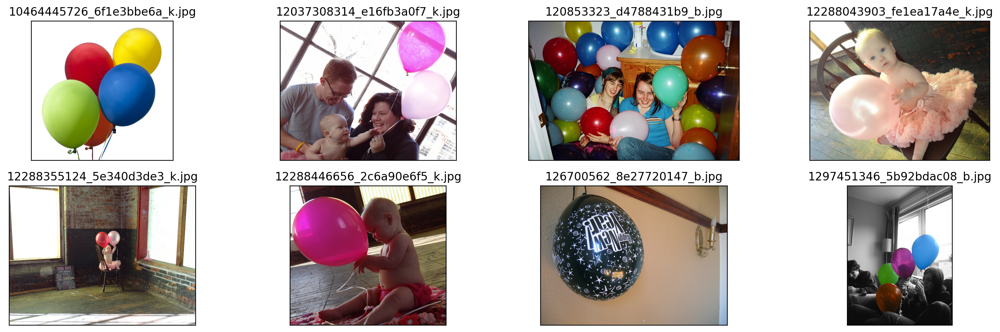

In [1]:
import os
import matplotlib.pyplot as plt
from PIL import Image

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

image_paths = [filename for filename in os.listdir('./mmdetection/data/balloon/train')][:8]

for i,filename in enumerate(image_paths):
    name = os.path.splitext(filename)[0]
    
    image = Image.open('./mmdetection/data/balloon/train/'+filename).convert("RGB")
    
    plt.subplot(2, 4, i+1)
    plt.imshow(image)
    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])
    
plt.tight_layout()

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


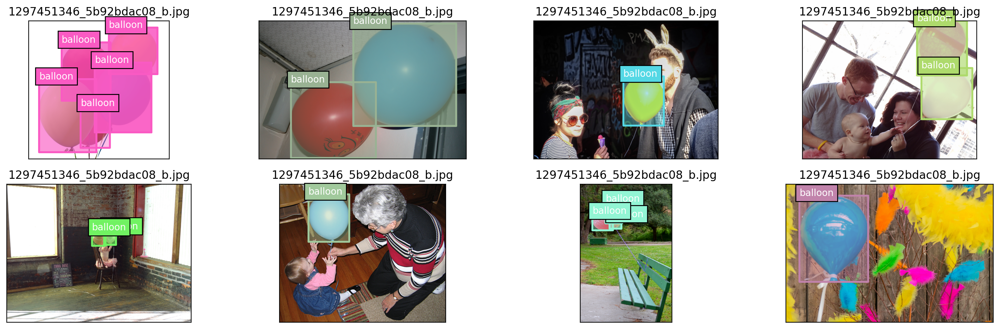

In [6]:
from pycocotools.coco import COCO
import numpy as np
import os.path as osp
from matplotlib.collections import PatchCollection
from matplotlib.patches import Polygon

def apply_exif_orientation(image):
    _EXIF_ORIENT = 274
    if not hasattr(image, 'getexif'):
        return image
    try:
        exif = image.getexif()
    except Exception:
        exif = None
    
    if exif is None:
        return image
    
    orientation = exif.get(_EXIF_ORIENT)
    
    method = {
        2: Image.FLIP_LEFT_RIGHT,
        3: Image.ROTATE_180,
        4: Image.FLIP_TOP_BOTTOM,
        5: Image.TRANSPOSE,
        6: Image.ROTATE_270,
        7: Image.TRANSVERSE,
        8: Image.ROTATE_90,
    }.get(orientation)
    if method is not None:
        return image.transpose(method)
    return image

def show_bbox_only(coco, anns, show_label_bbox=True, is_filling=True):
    """Show bounding box of annotations Only."""
    if len(anns) == 0:
        return
    
    ax = plt.gca()
    ax.set_autoscale_on(False)
    
    image2color = dict()
    for cat in coco.getCatIds():
        image2color[cat] = (np.random.random((1, 3)) * 0.7 + 0.3).tolist()[0]
        
    polygons = []
    colors = []
    
    for ann in anns:
        color = image2color[ann['category_id']]
        bbox_x, bbox_y, bbox_w, bbox_h = ann['bbox']
        poly = [[bbox_x, bbox_y], [bbox_x, bbox_y + bbox_h],
                [bbox_x + bbox_w, bbox_y + bbox_h], [bbox_x + bbox_w, bbox_y]]
        polygons.append(Polygon(np.array(poly).reshape((4,2))))
        colors.append(color)
        
        if show_label_bbox:
            label_bbox = dict(facecolor=color)
        else:
            label_bbox = None
            
        ax.text(
            bbox_x,
            bbox_y,
            '%s' % (coco.loadCats(ann['category_id'])[0]['name']),
            color='white',
            bbox=label_bbox)
        
        if is_filling:
            p = PatchCollection(
                polygons, facecolor=colors, linewidths=0,alpha=0.4)
            ax.add_collection(p)
        p = PatchCollection(
            polygons, facecolor='none', edgecolors=colors, linewidths=2)
        ax.add_collection(p)
        
coco = COCO('./mmdetection/data/balloon/train.json')
image_ids = coco.getImgIds()
np.random.shuffle(image_ids)

plt.figure(figsize=(16, 5))

# 只可视化 8 张图片
for i in range(8):
    image_data = coco.loadImgs(image_ids[i])[0]
    image_path = osp.join('./mmdetection/data/balloon/train',image_data['file_name'])
    annotation_ids = coco.getAnnIds(
        imgIds=image_data['id'], catIds=[], iscrowd=0)
    annotations = coco.loadAnns(annotation_ids)
    
    ax = plt.subplot(2, 4, i+1)
    image = Image.open(image_path).convert("RGB")
    
    image = apply_exif_orientation(image)
    
    ax.imshow(image)
    
    show_bbox_only(coco, annotations)
    
    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])
    
plt.tight_layout()
            

## 准备 config 配置文件

下述代码可直接在 ./configs/rtmdet/rtmdet_tiny_1xb4-20e_balloon.py 路径生成需要的配置文件

In [4]:
config_balloon = """
# Inherit and overwrite part of the config based on this config
_base_ = './rtmdet_tiny_8xb32-300e_coco.py'

data_root = 'data/balloon/' # dataset root

train_batch_size_per_gpu = 1
train_num_workers = 1

val_batch_size_per_gpu = 1
val_num_workers = 1

max_epochs = 50
stage2_num_epochs = 1
base_lr = 0.00008


metainfo = {
    'classes': ('balloon', ),
    'palette': [
        (220, 20, 60),
    ]
}

train_dataloader = dict(
    batch_size=train_batch_size_per_gpu,
    num_workers=train_num_workers,
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        data_prefix=dict(img='train/'),
        ann_file='train.json'))

val_dataloader = dict(
    batch_size=val_batch_size_per_gpu,
    num_workers=val_num_workers,
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        data_prefix=dict(img='val/'),
        ann_file='val.json'))

test_dataloader = val_dataloader

val_evaluator = dict(ann_file=data_root + 'val.json')

test_evaluator = val_evaluator

model = dict(bbox_head=dict(num_classes=1))

# learning rate
param_scheduler = [
    dict(
        type='LinearLR',
        start_factor=1.0e-5,
        by_epoch=False,
        begin=0,
        end=10),
    dict(
        # use cosine lr from 10 to 20 epoch
        type='CosineAnnealingLR',
        eta_min=base_lr * 0.05,
        begin=max_epochs // 2,
        end=max_epochs,
        T_max=max_epochs // 2,
        by_epoch=True,
        convert_to_iter_based=True),
]

train_pipeline_stage2 = [
    dict(type='LoadImageFromFile', backend_args=None),
    dict(type='LoadAnnotations', with_bbox=True),
    dict(
        type='RandomResize',
        scale=(640, 640),
        ratio_range=(0.1, 2.0),
        keep_ratio=True),
    dict(type='RandomCrop', crop_size=(640, 640)),
    dict(type='YOLOXHSVRandomAug'),
    dict(type='RandomFlip', prob=0.5),
    dict(type='Pad', size=(640, 640), pad_val=dict(img=(114, 114, 114))),
    dict(type='PackDetInputs')
]

# optimizer
optim_wrapper = dict(
    _delete_=True,
    type='OptimWrapper',
    optimizer=dict(type='AdamW', lr=base_lr, weight_decay=0.05),
    paramwise_cfg=dict(
        norm_decay_mult=0, bias_decay_mult=0, bypass_duplicate=True))

default_hooks = dict(
    checkpoint=dict(
        interval=5,
        max_keep_ckpts=2,  # only keep latest 2 checkpoints
        save_best='auto'
    ),
    logger=dict(type='LoggerHook', interval=5))

custom_hooks = [
    dict(
        type='PipelineSwitchHook',
        switch_epoch=max_epochs - stage2_num_epochs,
        switch_pipeline=train_pipeline_stage2)
]

# load COCO pre-trained weight
load_from = './checkpoints/rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth'

train_cfg = dict(type='EpochBasedTrainLoop', max_epochs=max_epochs, val_interval=1)
visualizer = dict(vis_backends=[dict(type='LocalVisBackend'),dict(type='TensorboardVisBackend')])
"""

with open('./configs/rtmdet/rtmdet_tiny_1xb4-20e_balloon.py', 'w') as f:
    f.write(config_balloon)

## 开启训练

### 下载预训练模型

In [20]:
# We download the pre-trained checkpoints for inference and finetuning.
!mkdir ./checkpoints
!mim download mmdet --config rtmdet_tiny_8xb32-300e_coco --dest ./checkpoints

命令语法不正确。


processing rtmdet_tiny_8xb32-300e_coco...
downloading ---------------------------------------- 0.0/54.9 MiB ? eta -:--:--
downloading --------------------------------- 0.2/54.9 MiB 3.8 MB/s eta 0:00:16
downloading --------------------------------- 0.4/54.9 MiB 4.5 MB/s eta 0:00:13
downloading --------------------------------- 0.7/54.9 MiB 5.0 MB/s eta 0:00:12
downloading  -------------------------------- 1.0/54.9 MiB 5.3 MB/s eta 0:00:11
downloading  -------------------------------- 1.3/54.9 MiB 6.5 MB/s eta 0:00:09
downloading  -------------------------------- 1.6/54.9 MiB 7.3 MB/s eta 0:00:08
downloading - ------------------------------- 2.0/54.9 MiB 8.2 MB/s eta 0:00:07
downloading - ------------------------------ 2.5/54.9 MiB 10.9 MB/s eta 0:00:06
downloading - ------------------------------ 3.2/54.9 MiB 13.1 MB/s eta 0:00:05
downloading -- ----------------------------- 3.8/54.9 MiB 13.1 MB/s eta 0:00:05
downloading -- ----------------------------- 4.2/54.9 MiB 13.1 MB/s eta 0:00:0

In [ ]:
!pip install setuptools==59.5.0  # 不装这个版本会报错

In [2]:
%run tools/train.py configs/rtmdet/rtmdet_tiny_1xb4-20e_balloon.py

06/12 10:06:25 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: win32
    Python: 3.8.16 (default, Mar  2 2023, 03:18:16) [MSC v.1916 64 bit (AMD64)]
    CUDA available: True
    numpy_random_seed: 40092366
    GPU 0: NVIDIA GeForce RTX 3080 Ti Laptop GPU
    CUDA_HOME: C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v11.7
    NVCC: Cuda compilation tools, release 11.7, V11.7.64
    MSVC: n/a, reason: fileno
    PyTorch: 1.10.1+cu113
    PyTorch compiling details: PyTorch built with:
  - C++ Version: 199711
  - MSVC 192829337
  - Intel(R) Math Kernel Library Version 2020.0.2 Product Build 20200624 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.2.3 (Git Hash 7336ca9f055cf1bfa13efb658fe15dc9b41f0740)
  - OpenMP 2019
  - LAPACK is enabled (usually provided by MKL)
  - CPU capability usage: AVX2
  - CUDA Runtime 11.3
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=com

D:\anaconda3\envs\openmmlab\lib\site-packages\torch\functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ..\aten\src\ATen\native\TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


06/12 10:06:37 - mmengine - INFO - Epoch(train)  [1][ 5/61]  lr: 3.5556e-05  eta: 0:43:33  time: 0.8584  data_time: 0.3938  memory: 392  loss: 2.6225  loss_cls: 1.8426  loss_bbox: 0.7800
06/12 10:06:37 - mmengine - INFO - Epoch(train)  [1][10/61]  lr: 8.0000e-05  eta: 0:23:53  time: 0.4717  data_time: 0.1976  memory: 394  loss: 2.6206  loss_cls: 1.8635  loss_bbox: 0.7571
06/12 10:06:38 - mmengine - INFO - Epoch(train)  [1][15/61]  lr: 8.0000e-05  eta: 0:17:15  time: 0.3411  data_time: 0.1321  memory: 392  loss: 2.4615  loss_cls: 1.7644  loss_bbox: 0.6971
06/12 10:06:38 - mmengine - INFO - Epoch(train)  [1][20/61]  lr: 8.0000e-05  eta: 0:14:02  time: 0.2782  data_time: 0.0994  memory: 392  loss: 2.5566  loss_cls: 1.8796  loss_bbox: 0.6770
06/12 10:06:38 - mmengine - INFO - Epoch(train)  [1][25/61]  lr: 8.0000e-05  eta: 0:12:01  time: 0.2386  data_time: 0.0797  memory: 395  loss: 2.6197  loss_cls: 1.9565  loss_bbox: 0.6632
06/12 10:06:39 - mmengine - INFO - Epoch(train)  [1][30/61]  lr: 

# 测试训练好的检测器

In [3]:
from mmdet.apis import DetInferencer
import glob

# Choose to use a config
config = 'configs/rtmdet/rtmdet_tiny_1xb4-20e_balloon.py'
# Setup a checkpoint file to load
checkpoint = glob.glob('./work_dirs/rtmdet_tiny_1xb4-20e_balloon/best_coco*.pth')[0]

# Set the device to be used for evaluation
device = 'cuda:0'

# Initialize the DetInferencer
inferencer = DetInferencer(config, checkpoint, device)

# Use the detector to do inference
img = './data/balloon.png'
result = inferencer(img, out_dir='./output')

Loads checkpoint by local backend from path: ./work_dirs/rtmdet_tiny_1xb4-20e_balloon\best_coco_bbox_mAP_epoch_44.pth
06/12 10:12:46 - mmengine - WARNING - Failed to search registry with scope "mmdet" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmdet" is a correct scope, or whether the registry is initialized.
06/12 10:12:46 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.


Output()

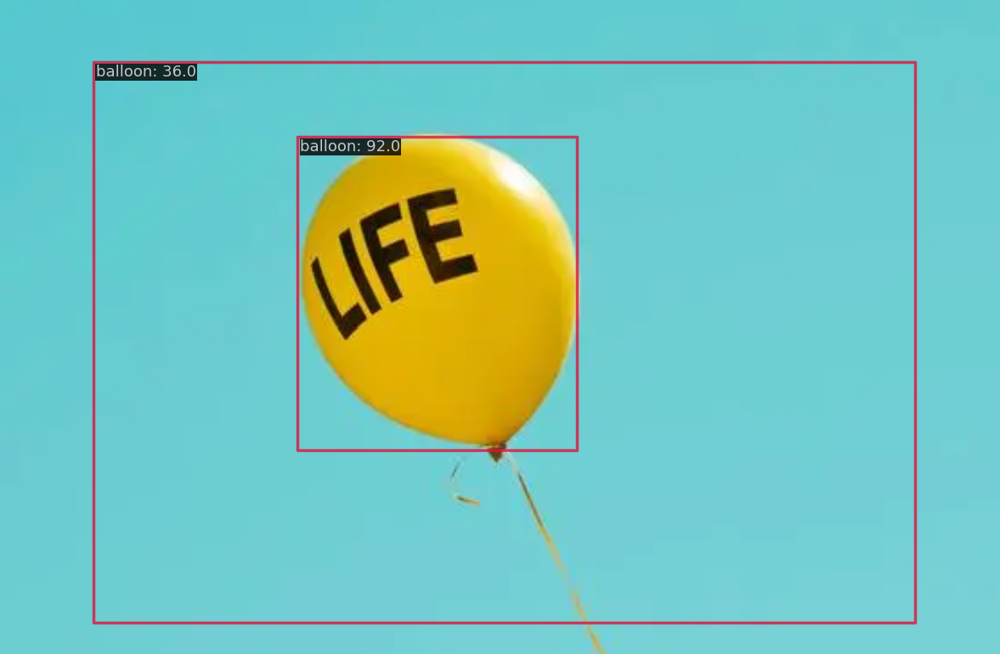

In [6]:
from PIL import Image
# Show the output image
Image.open('./output/vis/balloon.png')

# 可视化分析

## MMYOLO 环境和依赖安装

In [1]:
#%cd ../
!git clone -b tutorials git@github.com:open-mmlab/mmyolo.git
%cd mmyolo
%pip install -e .

D:\BUPT\openMMLab\AICamp2\OpenMMLabCampHomework\homework3_RTMDet_balloon_detect\mmyolo


Cloning into 'mmyolo'...


Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
Obtaining file:///D:/BUPT/openMMLab/AICamp2/OpenMMLabCampHomework/homework3_RTMDet_balloon_detect/mmyolo
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Running setup.py develop for mmyolo
Note: you may need to restart the kernel to use updated packages.


## 特征图可视化

In [2]:
import cv2

img = cv2.imread('../mmdetection/data/balloon.png')
h,w=img.shape[:2]
resized_img = cv2.resize(img, (640, 640))
cv2.imwrite('resized_image.jpg', resized_img)


True

### 1. 可视化 backbone 输出的 3 个通道

In [1]:
%cd mmyolo
!python demo/featmap_vis_demo.py  \
    resized_image.jpg  \
    ../mmdetection/configs/rtmdet/rtmdet_tiny_1xb4-20e_balloon.py  \
    ../mmdetection/work_dirs/rtmdet_tiny_1xb4-20e_balloon/epoch_50.pth  \
    --target-layers backbone  \
    --channel-reduction squeeze_mean


D:\BUPT\openMMLab\AICamp2\OpenMMLabCampHomework\homework3_RTMDet_balloon_detect\mmyolo
Loads checkpoint by local backend from path: ../mmdetection/work_dirs/rtmdet_tiny_1xb4-20e_balloon/epoch_50.pth
06/12 10:21:29 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
[                                                  ] 0/1, elapsed: 0s, ETA:
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1/1, 0.4 task/s, elapsed: 3s, ETA:     0sAll done!
Results have been saved at D:\BUPT\openMMLab\AICamp2\OpenMMLabCampHomework\homework3_RTMDet_balloon_detect\mmyolo\output


D:\anaconda3\envs\openmmlab\lib\site-packages\torch\functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ..\aten\src\ATen\native\TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
D:\anaconda3\envs\openmmlab\lib\site-packages\mmengine\visualization\visualizer.py:757: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(
D:\anaconda3\envs\openmmlab\lib\site-packages\mmengine\visualization\visualizer.py:828: UserWarning: Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(
D:\anaconda3\envs\openmmlab\lib\site-packages\mmengine\visualization\visualizer.py:984: UserWarning: Since the spatial dimensions of overlaid_image: (640, 640) and featmap: torch.Size([80, 80]) are not same, the feature map will be interpolated. This may cause mismatch problems ！
  warnin

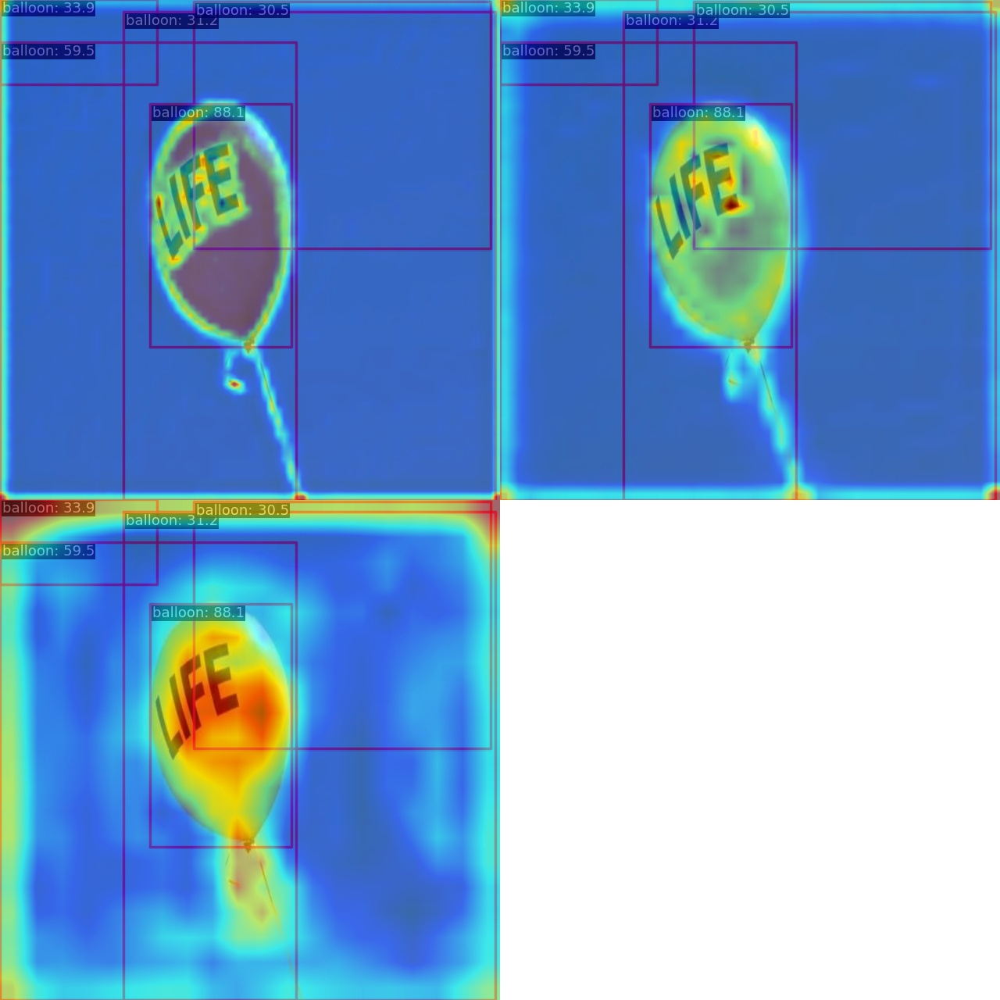

In [3]:
from PIL import Image
Image.open('output/resized_image.jpg')

### 2.可视化 neck 输出的 3 个通道

D:\anaconda3\envs\openmmlab\lib\site-packages\torch\functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ..\aten\src\ATen\native\TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
D:\anaconda3\envs\openmmlab\lib\site-packages\mmengine\visualization\visualizer.py:757: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(
D:\anaconda3\envs\openmmlab\lib\site-packages\mmengine\visualization\visualizer.py:828: UserWarning: Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(
D:\anaconda3\envs\openmmlab\lib\site-packages\mmengine\visualization\visualizer.py:984: UserWarning: Since the spatial dimensions of overlaid_image: (640, 640) and featmap: torch.Size([80, 80]) are not same, the feature map will be interpolated. This may cause mismatch problems ！
  warnin

Loads checkpoint by local backend from path: ../mmdetection/work_dirs/rtmdet_tiny_1xb4-20e_balloon/epoch_50.pth
06/12 10:25:41 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
[                                                  ] 0/1, elapsed: 0s, ETA:
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1/1, 0.4 task/s, elapsed: 3s, ETA:     0sAll done!
Results have been saved at D:\BUPT\openMMLab\AICamp2\OpenMMLabCampHomework\homework3_RTMDet_balloon_detect\mmyolo\output


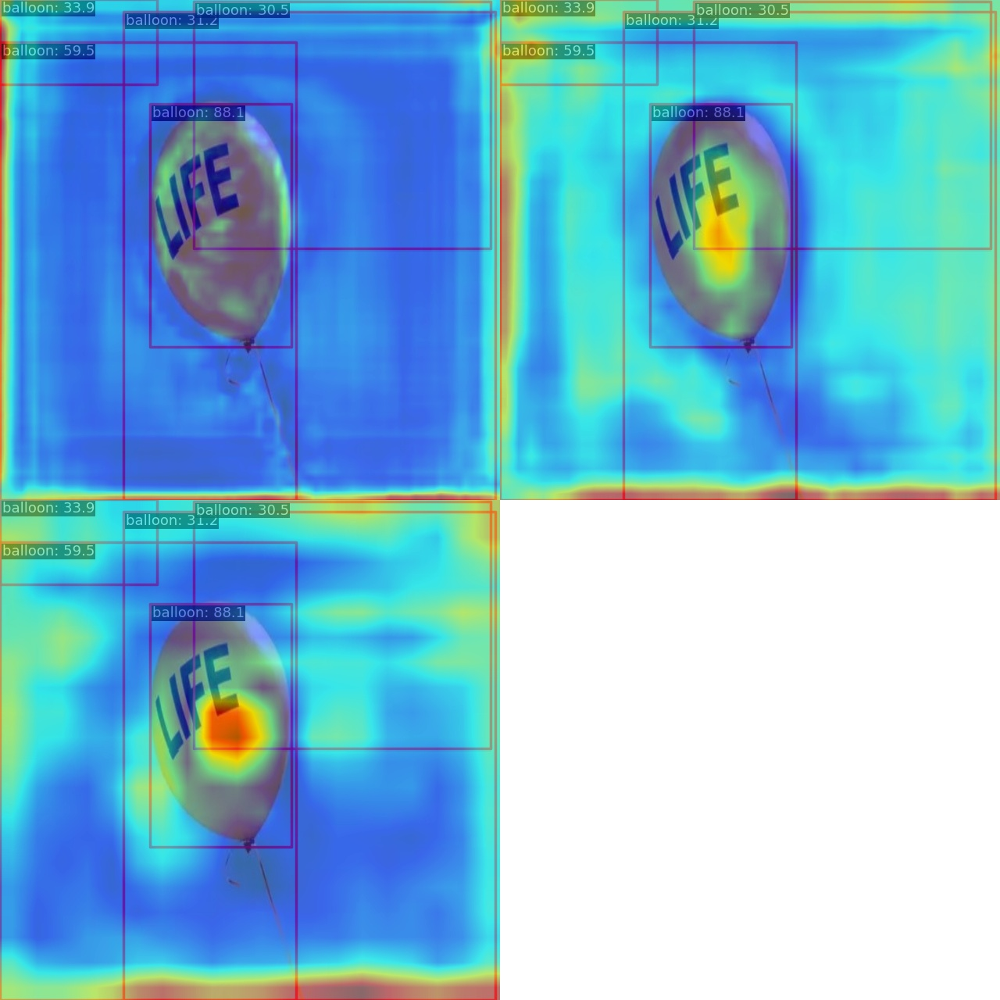

In [4]:
!python demo/featmap_vis_demo.py  \
    resized_image.jpg  \
    ../mmdetection/configs/rtmdet/rtmdet_tiny_1xb4-20e_balloon.py  \
    ../mmdetection/work_dirs/rtmdet_tiny_1xb4-20e_balloon/epoch_50.pth  \
    --target-layers neck  \
    --channel-reduction squeeze_mean
Image.open('output/resized_image.jpg')

## Grad Box AM 可视化

In [5]:
!pip install "grad-cam"

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
     ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
     ---- ----------------------------------- 0.8/7.8 MB 16.3 MB/s eta 0:00:01
     ----------- ---------------------------- 2.1/7.8 MB 22.9 MB/s eta 0:00:01
     ----------------- ---------------------- 3.4/7.8 MB 24.4 MB/s eta 0:00:01
     --------------------------- ------------ 5.3/7.8 MB 28.2 MB/s eta 0:00:01
     ------------------------------- -------- 6.1/7.8 MB 26.1 MB/s eta 0:00:01
     ------------------------------- -------- 6.2/7.8 MB 23.4 MB/s eta 0:00:01
     --------------------------------- ------ 6.5/7.8 MB 19.9 MB/s eta 0:00:01
     ---------------------------------- ----- 6.7/7.8 MB 17.9 MB/s eta 0:00:01
     ----------------------------------- ---- 6.9/7.8 MB 16.2 MB/s eta 0:00:01
     ------------------------------------ --- 7.1/7.8 MB 15.2 MB/s eta 0:00:01
     ------------------------------------- -- 7.3/7.8 MB 14.5 MB/s eta 0:00:01

### (a)查看 neck 输出的最小输出特征图的 Grad CAM

In [1]:
%cd mmyolo
!python demo/boxam_vis_demo.py  \
    resized_image.jpg  \
    ../mmdetection/configs/rtmdet/rtmdet_tiny_1xb4-20e_balloon.py  \
    ../mmdetection/work_dirs/rtmdet_tiny_1xb4-20e_balloon/epoch_50.pth  \
    --target-layers neck.out_convs[2]
from PIL import Image
#Image.open('output/resized_image.jpg')

D:\BUPT\openMMLab\AICamp2\OpenMMLabCampHomework\homework3_RTMDet_balloon_detect\mmyolo
The algorithm currently used is rtmdet
Loads checkpoint by local backend from path: ../mmdetection/work_dirs/rtmdet_tiny_1xb4-20e_balloon/epoch_50.pth
[                                                  ] 0/1, elapsed: 0s, ETA:
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1/1, 0.3 task/s, elapsed: 3s, ETA:     0sAll done!
Results have been saved at D:\BUPT\openMMLab\AICamp2\OpenMMLabCampHomework\homework3_RTMDet_balloon_detect\mmyolo\output


D:\anaconda3\envs\openmmlab\lib\site-packages\torch\functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ..\aten\src\ATen\native\TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
D:\anaconda3\envs\openmmlab\lib\site-packages\torch\nn\functional.py:3631: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn(


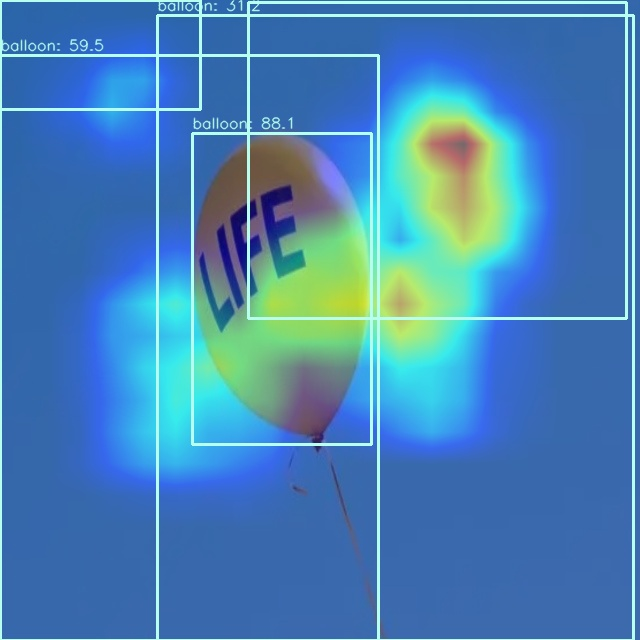

In [2]:
Image.open('output/resized_image.jpg')